In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
!pip install --upgrade diffusers[flax]

In [3]:
# in order to use TPU you have to run this cell before importing JAX
import jax.tools.colab_tpu
jax.tools.colab_tpu.setup_tpu()

In [4]:
from jax.lib import xla_bridge
print(xla_bridge.get_backend().platform)

tpu


In [5]:
import jax
import jax.numpy as jnp

In [6]:
jax.local_devices()

[TpuDevice(id=0, process_index=0, coords=(0,0,0), core_on_chip=0),
 TpuDevice(id=1, process_index=0, coords=(0,0,0), core_on_chip=1),
 TpuDevice(id=2, process_index=0, coords=(1,0,0), core_on_chip=0),
 TpuDevice(id=3, process_index=0, coords=(1,0,0), core_on_chip=1),
 TpuDevice(id=4, process_index=0, coords=(0,1,0), core_on_chip=0),
 TpuDevice(id=5, process_index=0, coords=(0,1,0), core_on_chip=1),
 TpuDevice(id=6, process_index=0, coords=(1,1,0), core_on_chip=0),
 TpuDevice(id=7, process_index=0, coords=(1,1,0), core_on_chip=1)]

In [7]:
#from huggingface_hub import notebook_login
from diffusers import FlaxStableDiffusionPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [8]:
from flax.jax_utils import replicate
from flax.training.common_utils import shard
from PIL import Image

In [9]:
pipeline, params = FlaxStableDiffusionPipeline.from_pretrained(
    #"runwayml/stable-diffusion-v1-5",
    "stabilityai/stable-diffusion-2-1",
    revision="bf16",
    dtype=jnp.bfloat16,
)

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/configuration_utils.py:239: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)
/usr/local/lib/python3.10/dist-packages/diffusers/configuration_utils.py:239: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a model, please use <class 'diffusers.models.unet_2d_condition_flax.FlaxUNet2DConditionModel'>.load_config(...) followed by <class 'diffusers.models.unet_2d_condition_flax.FlaxUNet2DConditionModel'>.from_config(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)
The config attributes {'act_fn': 'silu', 'center_input_sample': False, 'downsample_padding': 1, 'dual_cross_attention':

In [10]:
prompts = [
    "Three leopards holding a scarlet rose and in the centre a green rat.",
    "A large glass bottle full of tiny elephants of different colors",
    "HAL-9000 in the style of Picasso",
    "Pink panther drinking a coffee. ",
    "Golden tiger fighting vikings in a modern city, Van Gogh style",
    "A blue Axolotl sitting on an emerald throne.",
    "A pumpkin-shape spaceship spinning around the Moon",
    "Black panther doing his homework",
]

In [11]:
p_params = replicate(params)

In [12]:
prompt_ids = pipeline.prepare_inputs(prompts)
prompt_ids = shard(prompt_ids)

In [13]:
seed = 42
rng = jax.random.PRNGKey(seed)
rng = jax.random.split(rng, jax.device_count())

In [14]:
images = pipeline(prompt_ids, p_params, rng, jit=True).images

In [15]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

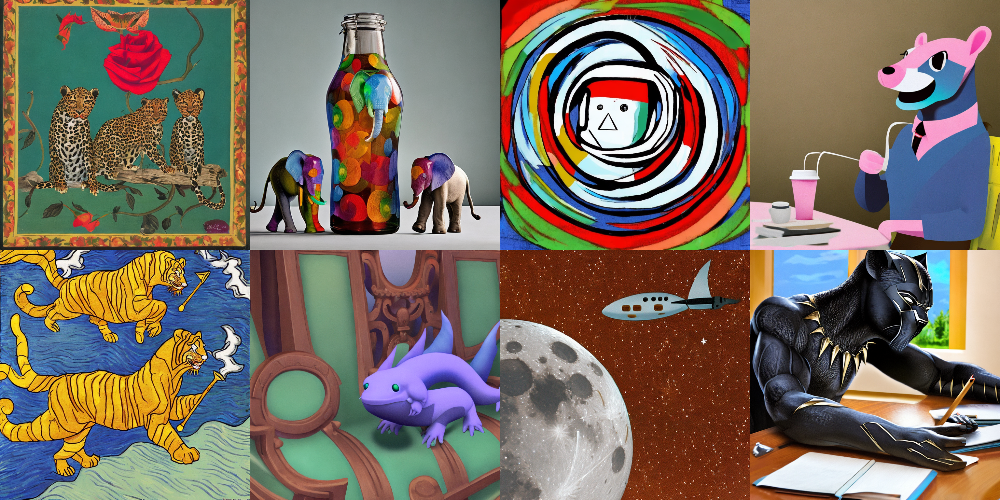

In [16]:
images = images.reshape((images.shape[0], ) + images.shape[-3:])
images = pipeline.numpy_to_pil(images)
image_grid(images, 2, 4)